In [35]:
import sys
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
from os import listdir
from os.path import isfile, join
import pickle



data_type = 'float32'
sc.settings.set_figure_params(dpi = 100, color_map = 'RdPu', dpi_save = 100,
                              vector_friendly = True, format = 'pdf',
                              facecolor='white')
sc.settings.figdir = './figures-cell2location/'


# this line forces theano to use the GPU and should go before importing cell2location
# os.environ["THEANO_FLAGS"] = 'device=cuda0,floatX=' + data_type + ',force_device=True'
# if using the CPU uncomment this:
#os.environ["THEANO_FLAGS"] = 'device=cpu,floatX=float32,openmp=True,force_device=True'
#os.environ["OMP_NUM_THREADS"] = '8'
#sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/cell2location/')

import cell2location

from matplotlib import rcParams
import seaborn as sns

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 0

from cell2location.plt.mapping_video import plot_spatial

def select_slide(adata_vis, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata_vis[adata_vis.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

In [45]:
path = '/nfs/users/nfs_l/lg18/team292/lg18/gonads/data/visium/cell2location/'
path_data = '/nfs/users/nfs_l/lg18/team292/lg18/gonads/data/visium/cell2location/'

donors = ['F91']#["F83", "F91", "Hrv11"]#, 'F94']
donor2sample = {'females':["FCA_GNDST8796125", "FCA_GNDST8796126", 
                          "FCA_GNDST8796128", "FCA_GNDST8796127", 
                           "FCA_GNDST8796131", "FCA_GNDST8796132"],
               'Hrv41':['FCA_GNDST9421026'],
               'F81':['FCA_GNDST9421027'],
               'F83':["FCA_GNDST8796125", "FCA_GNDST8796126"], 
               'F91':["FCA_GNDST8796127", "FCA_GNDST8796128"],
               'Hrv11':["FCA_GNDST8796131", "FCA_GNDST8796132"],
               'males':["FCA_GNDST8796129", "FCA_GNDST8796130", 'FCA_GNDST9421026'],
               'F94':["FCA_GNDST8796129", "FCA_GNDST8796130"]}

sample2donor = {"FCA_GNDST8796125":'F83', 
                "FCA_GNDST8796126":'F83',
                'FCA_GNDST9421027':'F81',
                "FCA_GNDST8796127":'F91', 
                "FCA_GNDST8796128":'F91',
                "FCA_GNDST8796131":'Hrv11', 
                "FCA_GNDST8796132":'Hrv11',
                'FCA_GNDST9421024':'Hrv39',
                'FCA_GNDST9421026':'Hrv41',
                "FCA_GNDST8796129":'F94',
                "FCA_GNDST8796130":'F94'
}

In [46]:
cluster_sets = {'Supporting_I': ['sKITLG', 'sLGR5',  'sPAX8b', 'sPAX8m'],
                'Supporting_G_I': [ 'preGC_II',   'preGC_II_hypoxia', 'preGC_III', 'preGC_III_Notch'],
                'Supporting_G_II': [ 'ovarianSurf',  'preGC_II',  'preGC_II_hypoxia', 'preGC_I_OSR1'],
                'Supporting_G_III': [ 'ovarianSurf',  'preGC_II',  'preGC_III', 'preGC_I_OSR1'],
                'Supporting_G_IV': ['ovarianSurf',  'preGC_II',  'preGC_III_Notch', 'preGC_I_OSR1'],
                'Supporting_T': ['Sertoli',  'Sertoli_WFDC2',  'coelEpi'],
                 'Germ cells I': ['PGC', 'GC_mitotic',  'pre-spermatogonia'],
                 'Germ cells II ': ['PGC', 'oogonia_STRA8',  'oogonia_meiosis',  'oocyte'],
                 'Germ cells III ': ['PGC', 'oogonia_STRA8',  'oogonia_meiosis'],
                 'Mesothelial_Supp': ['coelEpi',  'ovarianSurf'],
                'other_I': ['lymphoid', 'myeloid', 'Erythroid', 'Immune'],
                'other_II': ['PV', 'Epithelial', 'Endothelial'],
                 'Mesenchymal_O': ['Gi',  'Oi'],
                 'Mesenchymal_T': ['Gi',  'FetalLeydig', 'Ti'],
                 'Mesenchymal_M_I': [  'M_MGP', 'M_ALX1',  'M_prog_ISL1'],
                 'Mesenchymal_M_II': [ 'M_MGP', 'M_MullDuct_AMHR2', 'M_MullDuct_LGR5'],
                 'Mesenchymal_M_III': [  'M_MGP']
               }

F91
FCA_GNDST8796127


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.


Supporting_I
Supporting_G_I
Supporting_G_II
Supporting_G_III
Supporting_G_IV
Supporting_T
Germ cells I
Germ cells II 
Germ cells III 
Mesothelial_Supp
other_I
other_II
Mesenchymal_O
Mesenchymal_T
Mesenchymal_M_I
Mesenchymal_M_II
Mesenchymal_M_III
FCA_GNDST8796128


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.


Supporting_I
Supporting_G_I
Supporting_G_II
Supporting_G_III
Supporting_G_IV
Supporting_T
Germ cells I
Germ cells II 
Germ cells III 
Mesothelial_Supp
other_I
other_II
Mesenchymal_O
Mesenchymal_T
Mesenchymal_M_I
Mesenchymal_M_II
Mesenchymal_M_III


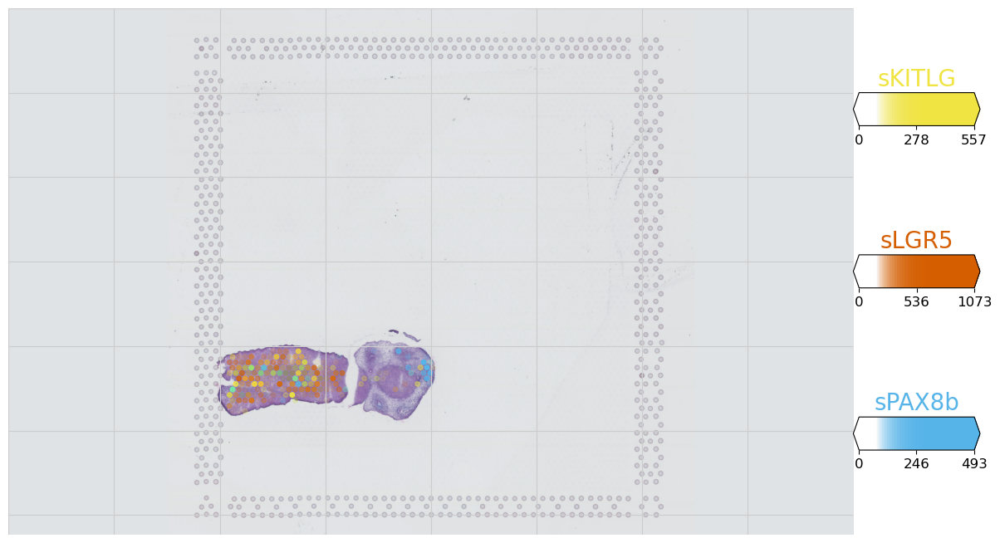

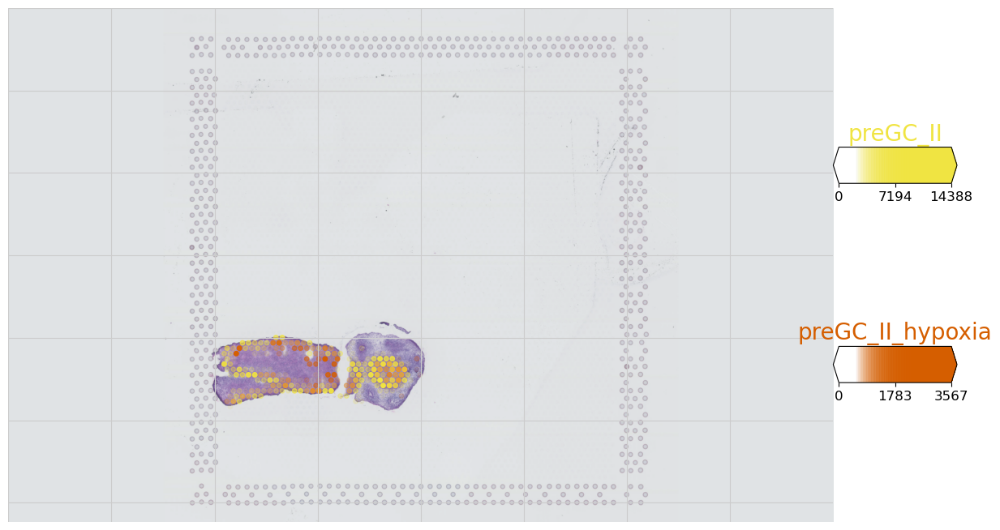

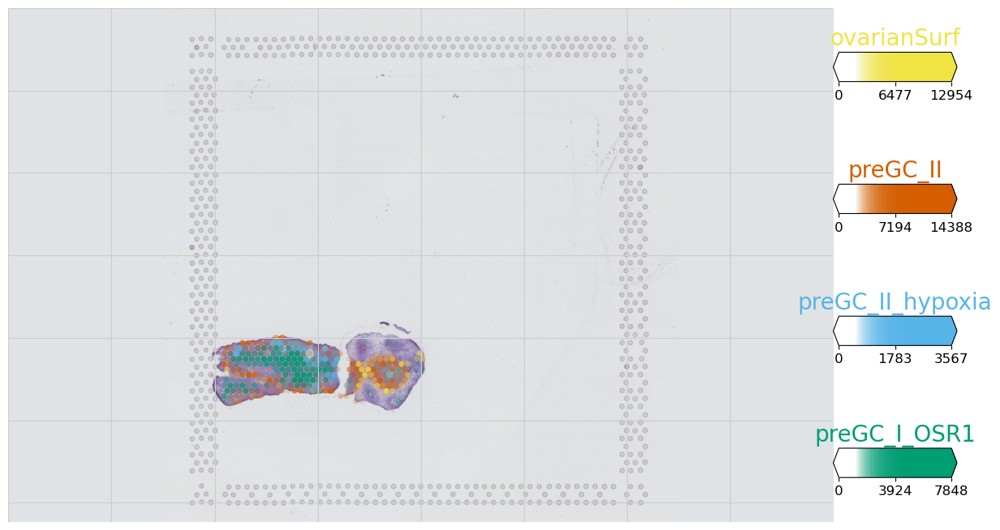

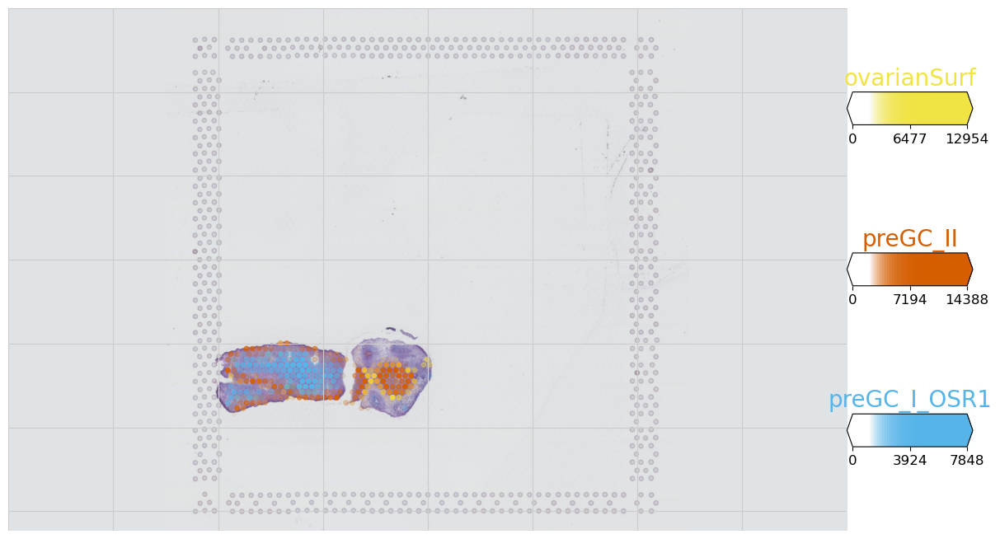

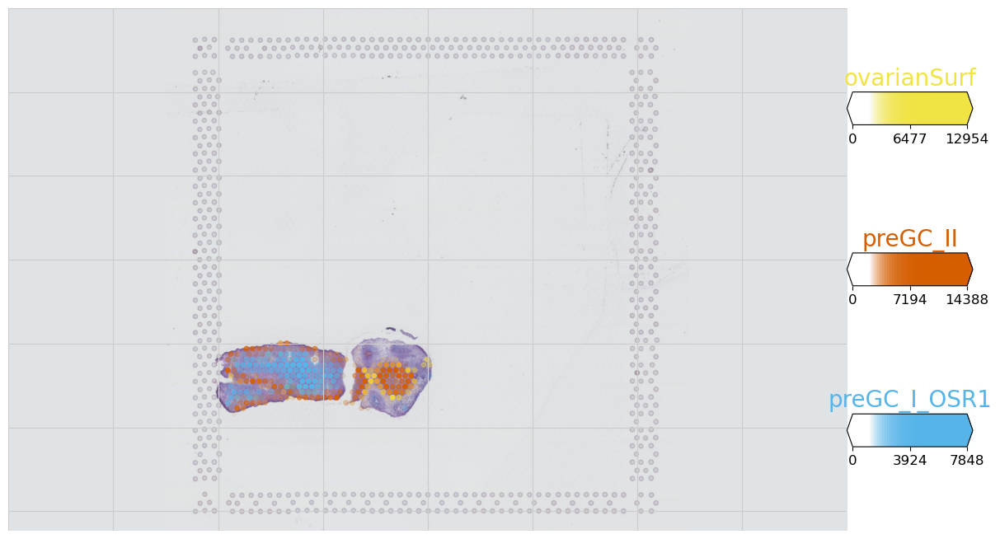

...

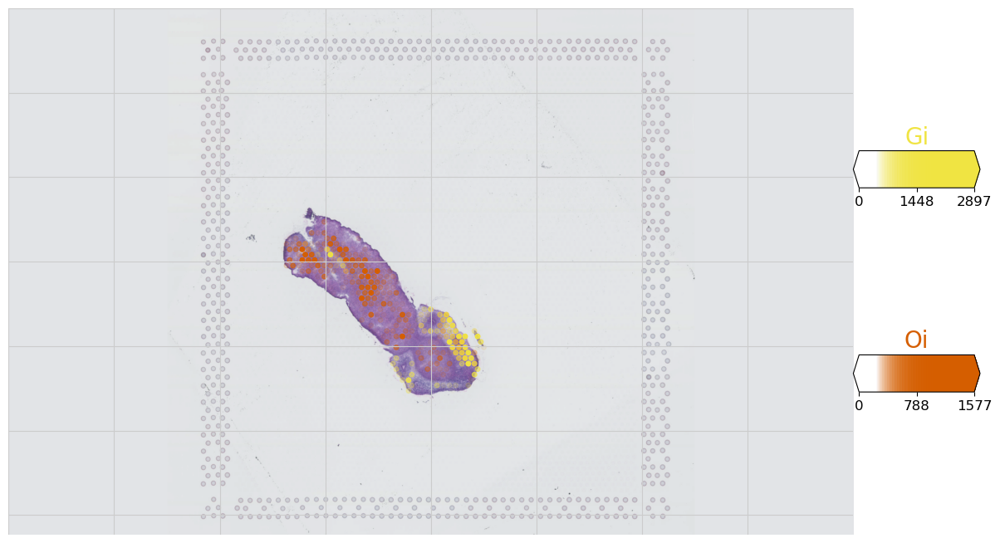

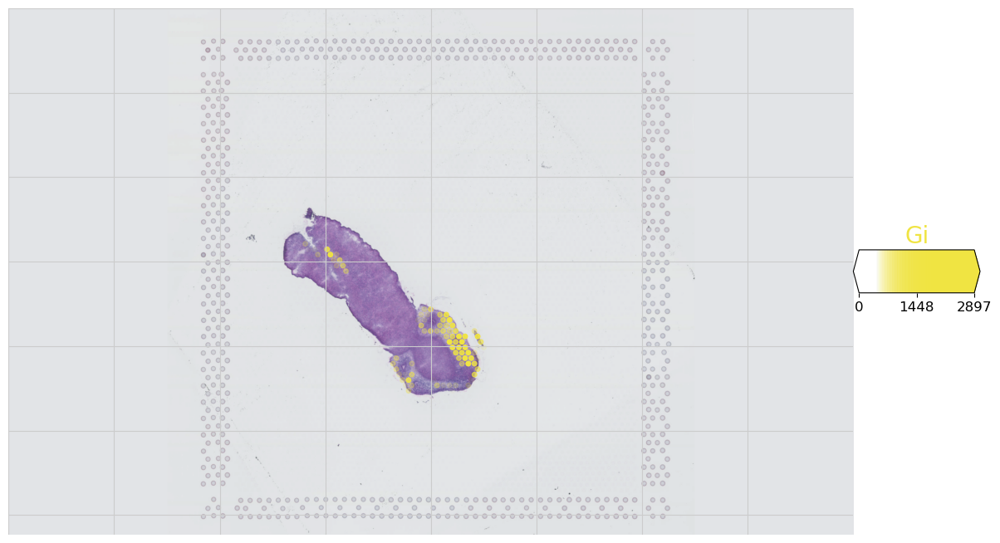

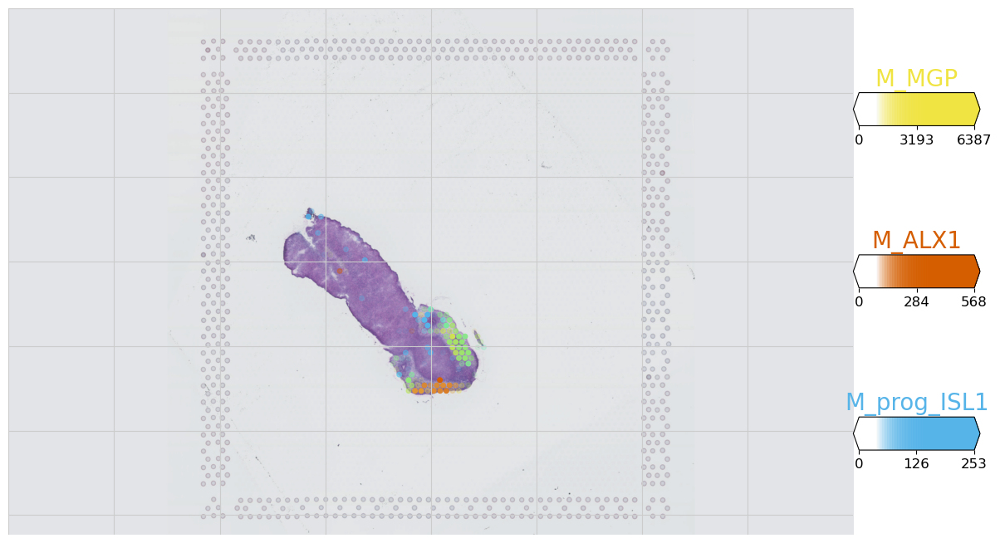

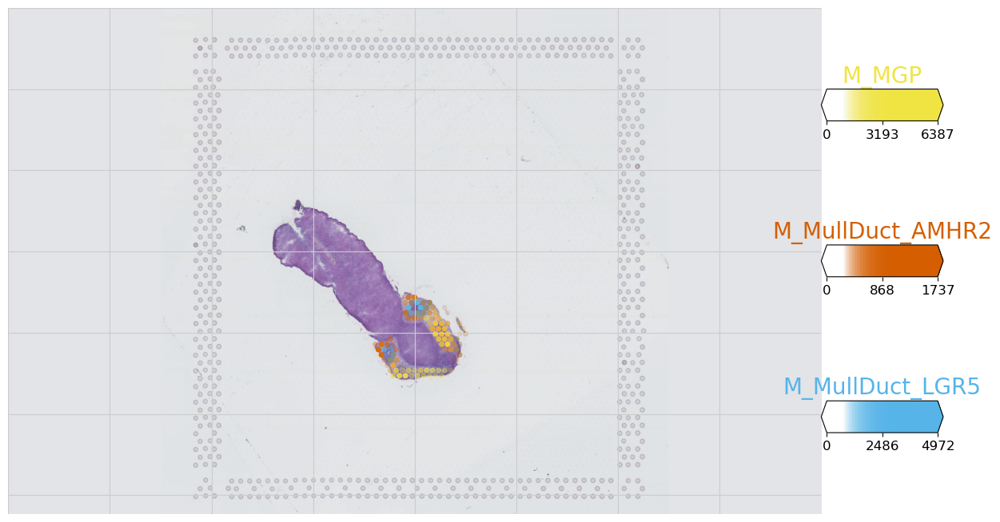

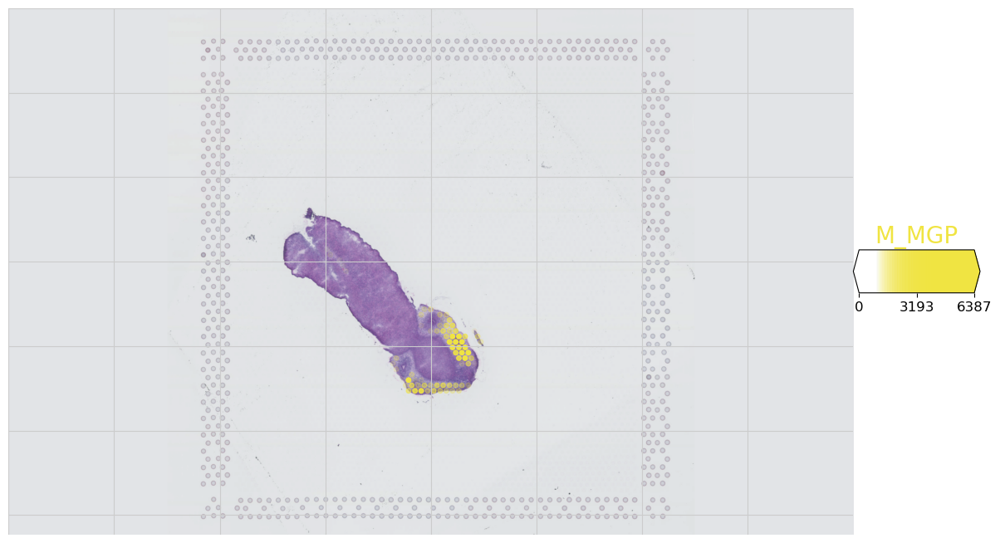

In [47]:
for donor in donors:
    print(donor)
    sc.settings.figdir = './figures-cell2location/'+donor+'/'
    for visium_slide in donor2sample[donor]:
        print(visium_slide)
        # Load cell2location results
        results_folder = path+donor+'/cell2location/'
        run_name = [f for f in listdir(path+donor+'/cell2location/std_model/') if 'LocationModel' in f]
        sp_data_file = results_folder + 'std_model/'+run_name[0]+'/sp.h5ad'
        adata_vis = anndata.read(sp_data_file)

        # Load scRNAseq reference to remind the clusters
        scRNAseq_file = [f for f in listdir(path_data+donor) if isfile(join(path_data+donor, f)) and 'scRNAseq' in f]
        adata_raw_sc = sc.read(path_data+donor+'/'+scRNAseq_file[0])
        # set(adata_raw_sc.obs.labels.values)

        # Visualisation of cell locations
        slide = select_slide(adata_vis, visium_slide)

        for clset in cluster_sets.keys():
            print(clset)
            # visualise locations of multiple cell types at once using absolute mRNA counts
            sel_clust = cluster_sets[clset]
            sel_clust = [value for value in sel_clust if value in adata_vis.uns.data['mod']['fact_names'].tolist()] 
            if len(sel_clust) > 0:
#                 sel_clust_col = ['mean_nUMI_factors' + str(i) for i in sel_clust]

#                 with mpl.rc_context({'figure.figsize': (15, 15)}):
#                     fig = plot_spatial(slide.obs[sel_clust_col], 
#                                   coords=slide.obsm['spatial'] \
#                                           * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'],
#                                   show_img=True, img_alpha=0.8,
#                                   img=list(slide.uns['spatial'].values())[0]['images']['hires'],
#                                   circle_diameter=4, labels=sel_clust, colorbar_position='right')


                # plot the 5% quantile of the posterior distribution on the number of UMI 
                # which shows the mRNA count assigned to each cell type with high confidence.    
                sel_clust_col = ['q05_nUMI_factors' + str(i) for i in sel_clust]

                with mpl.rc_context({'figure.figsize': (15, 15)}):
                    fig = plot_spatial(slide.obs[sel_clust_col],
                           coords=slide.obsm['spatial'] \
                                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'],
                                  show_img=True, img_alpha=0.8,
                                  img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                                  white_spacing=15,
                                  circle_diameter=4, labels=sel_clust, colorbar_position='right')
                    plt.savefig(fname = 'figures-cell2location/'+donor+'/'+visium_slide+'_'+clset+'_q05_nUMI_factors_'+clset+'.pdf', 
                                dpi=None, facecolor='w', edgecolor='w',
                            orientation='landscape', papertype=None, format='pdf',
                            transparent=False, bbox_inches=None, pad_inches=0.1,
                            frameon=None, metadata=None)

                sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

                # plot with nice names
                with mpl.rc_context({'figure.figsize': (10, 10), "font.size": 18}):
                    slide.obs[sel_clust] = (slide.obs[sel_clust_col])
                    sc.pl.spatial(slide, cmap='viridis',
                                  color=sel_clust[0:6], # limit size in this notebook
                                  ncols=3,
                                  size=0.9, img_key='hires',
                                  alpha_img=0.5,
                                  vmin=0, vmax='p99.2',
                                  save = '_'+donor+'_'+visium_slide+'_'+clset+'_q05_spot_factors.pdf',
                                  show = False
                                 )

females


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


init_1 - iterations until convergence: 3178
init_2 - iterations until convergence: 3018
init_3 - iterations until convergence: 2945
init_4 - iterations until convergence: 3057
init_5 - iterations until convergence: 3074
figures-cell2location/females/model_CoLocatedGroupsSklearnNMF_4_.p


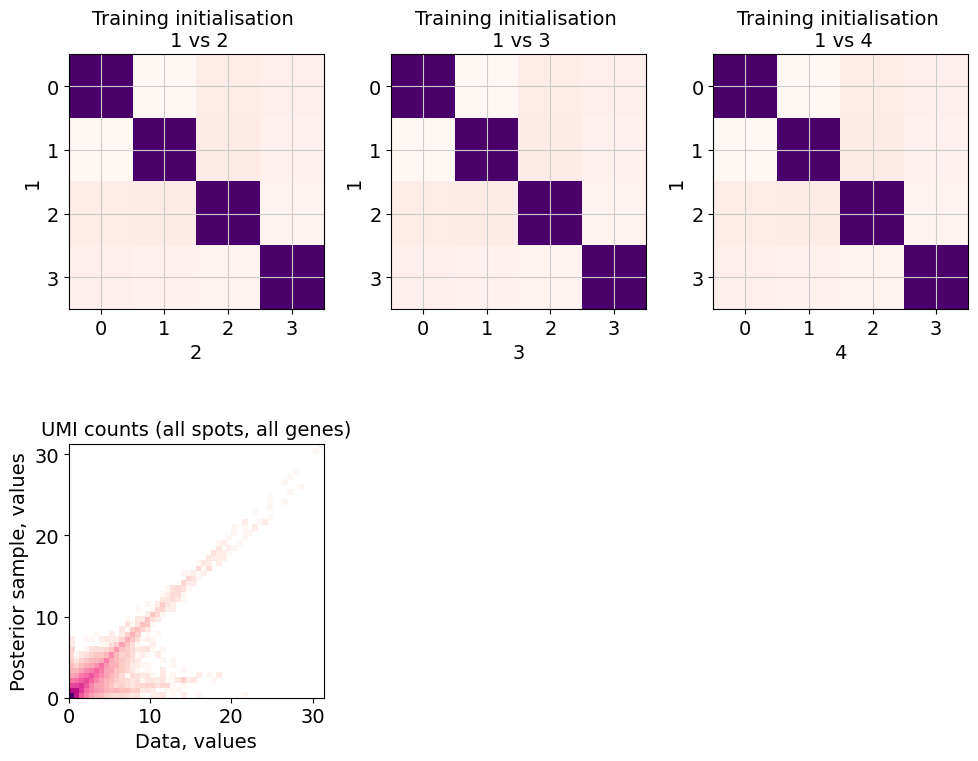

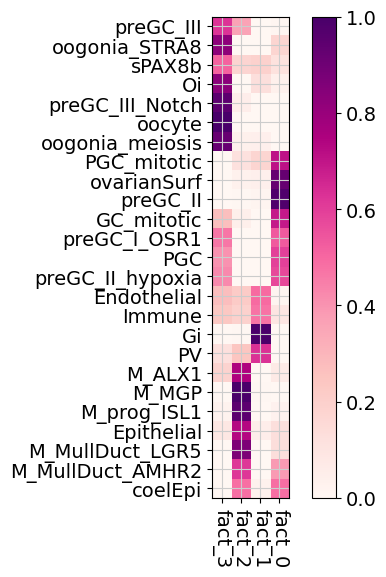

In [26]:
#Identify co-occuring cell type combinations using matrix factorisation


for donor in donors:
        print(donor)
        sc.settings.figdir = './figures-cell2location/'+donor+'/'
         
        # Load cell2location results
        results_folder = path+donor+'/cell2location/'
        run_name = [f for f in listdir(path+donor+'/cell2location/std_model/') if 'LocationModel' in f]
        sp_data_file = results_folder + 'std_model/'+run_name[0]+'/sp.h5ad'
        adata_vis = anndata.read(sp_data_file)

        # Load scRNAseq reference to remind the clusters
        scRNAseq_file = [f for f in listdir(path_data+donor) if isfile(join(path_data+donor, f)) and 'scRNAseq' in f]
        adata_raw_sc = sc.read(path_data+donor+'/'+scRNAseq_file[0])
        # set(adata_raw_sc.obs.labels.values)
        
        # number of cell type combinations - educated guess assuming that most cell types don't co-locate
        n_fact = int(4)

        # extract cell abundance from cell2location
        X_data = adata_vis.uns['mod']['post_sample_q05']['spot_factors']

        import cell2location.models as c2l
        # create model class
        mod_sk = c2l.CoLocatedGroupsSklearnNMF(n_fact, X_data,
                n_iter = 10000,
                verbose = True,
                var_names=adata_vis.uns['mod']['fact_names'],
                obs_names=adata_vis.obs_names,
                fact_names=['fact_' + str(i) for i in range(n_fact)],
                sample_id=adata_vis.obs['sample'],
                init='random', random_state=0,
                nmf_kwd_args={'tol':0.0001})

        # train 5 times to evaluate stability
        mod_sk.fit(n=5, n_type='restart')


        ## Do some diagnostics
        # evaluate stability by comparing trainin restarts

        with mpl.rc_context({'figure.figsize': (10, 8)}):
            mod_sk.evaluate_stability('cell_type_factors', align=True)


        # evaluate accuracy of the model
        mod_sk.compute_expected()
        mod_sk.plot_posterior_mu_vs_data()


        # extract parameters into DataFrames
        mod_sk.sample2df(node_name='nUMI_factors', ct_node_name = 'cell_type_factors')

        # export results to scanpy object
        adata_vis = mod_sk.annotate_adata(adata_vis) # as columns to .obs
        adata_vis = mod_sk.export2adata(adata_vis, slot_name='mod_sklearn') # as a slot in .uns

        # print the fraction of cells of each type located to each combination
        mod_sk.print_gene_loadings(loadings_attr='cell_type_fractions',
                                 gene_fact_name='cell_type_fractions')


        # make nice names
        from re import sub
        mod_sk.cell_type_fractions.columns = [sub('mean_cell_type_factors', '', i)
                                              for i in mod_sk.cell_type_fractions.columns]

        # plot co-occuring cell type combinations
        mod_sk.plot_gene_loadings(mod_sk.var_names_read, mod_sk.var_names_read,
                                fact_filt=mod_sk.fact_filt,
                                loadings_attr='cell_type_fractions',
                                gene_fact_name='cell_type_fractions',
                                cmap='RdPu', figsize=[5, 6])
        plt.savefig('figures-cell2location/'+donor+'/microenviroments_cooccuringCombinations.pdf', dpi=75, figsize=(8,15))
        # write csv
        gene_loadings = getattr(mod_sk, 'cell_type_fractions').copy()
        gene_loadings.to_csv('figures-cell2location/'+donor+'/microenviroments_cooccuringCombinations.csv', index=True) 


        # plot cell density in each combination
        for i in range(len(donor2sample[donor])):
            with mpl.rc_context({'figure.figsize': (5, 6), 'axes.facecolor': 'black'}):
                sc.pl.spatial(adata_vis[adata_vis.obs['sample'].isin([adata_vis.obs['sample'].unique()[i]]),:],
                              cmap='magma', library_id=list(adata_vis.uns['spatial'].keys())[i],
                              color=mod_sk.location_factors_df.columns,
                              ncols=6,
                              size=1, img_key='hires',
                              alpha_img=0,
                              vmin=0, vmax='p99.2',
                              save = donor+'_'+donor2sample[donor][i]+'_microenviroments_cooccuringCombinations.pdf',
                              show = False
                             )

        # save co-location models object
        def pickle_model(mod, path, file_suffix=''):
            file = 'figures-cell2location/'+donor+'/model_' + str(mod.__class__.__name__) + '_' + str(mod.n_fact) + '_' + file_suffix + ".p"
            pickle.dump({'mod': mod, 'fact_names': mod.fact_names}, file = open(file, "wb"))
            print(file)

        pickle_model(mod_sk, 'figures-cell2location/'+donor+'/', file_suffix='')

females


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.


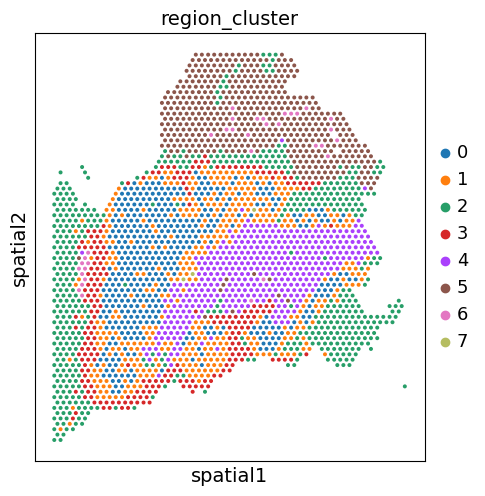

Trying to set attribute `.uns` of view, copying.


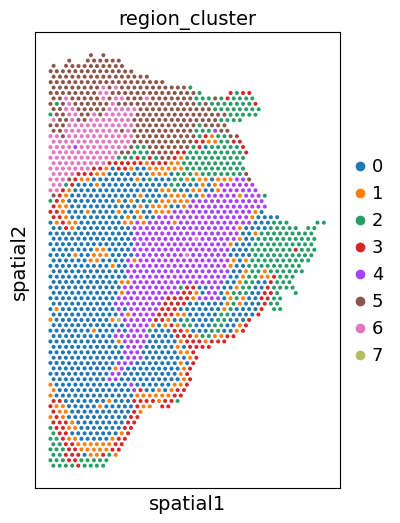

Trying to set attribute `.uns` of view, copying.


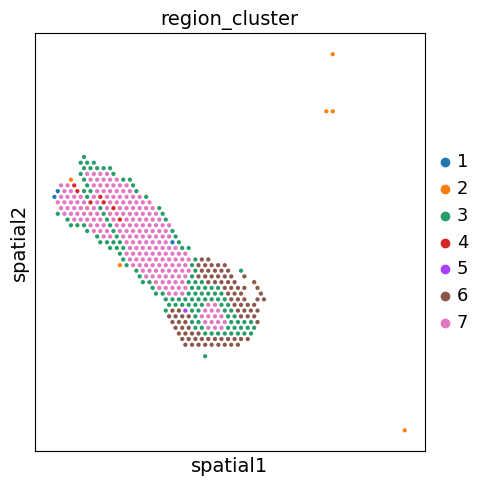

Trying to set attribute `.uns` of view, copying.


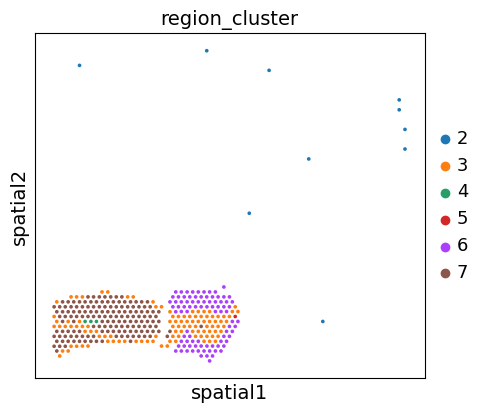

Trying to set attribute `.uns` of view, copying.


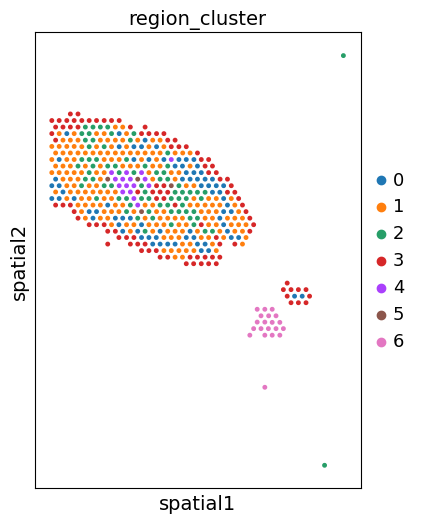

Trying to set attribute `.uns` of view, copying.


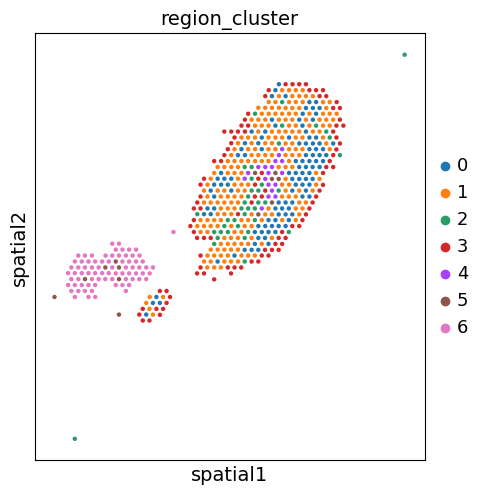

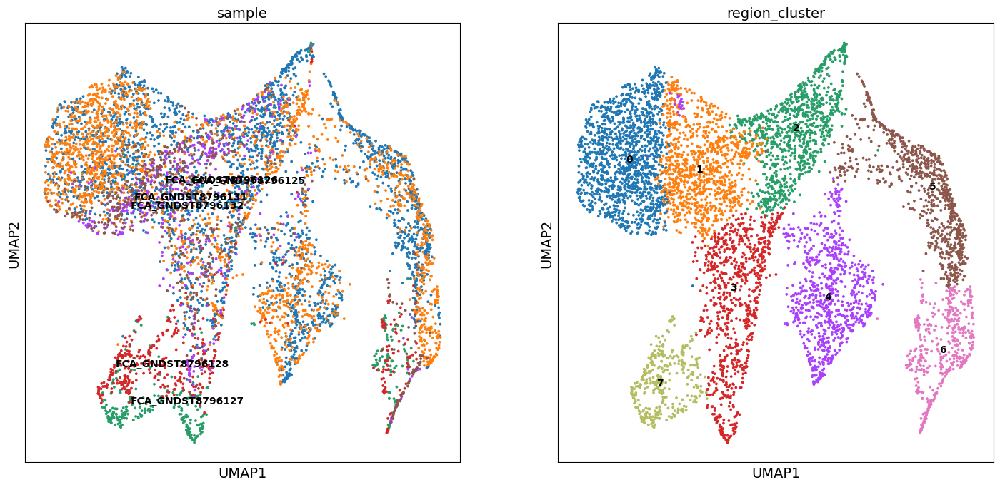

In [27]:
# Automatic discrete region identification by clustering cell densities

for donor in donors:
    
    print(donor)
    sc.settings.figdir = './figures-cell2location/'+donor+'/'
    
    # Load cell2location results
    results_folder = path+donor+'/cell2location/'
    run_name = [f for f in listdir(path+donor+'/cell2location/std_model/') if 'LocationModel' in f]
    sp_data_file = results_folder + 'std_model/'+run_name[0]+'/sp.h5ad'
    adata_vis = anndata.read(sp_data_file)

    # Load scRNAseq reference to remind the clusters
    scRNAseq_file = [f for f in listdir(path_data+donor) if isfile(join(path_data+donor, f)) and 'scRNAseq' in f]
    adata_raw_sc = sc.read(path_data+donor+'/'+scRNAseq_file[0])
    # set(adata_raw_sc.obs.labels.values)
        
        
    sample_type = 'q05_nUMI_factors'
    col_ind = [sample_type in i for i in adata_vis.obs.columns.tolist()]
    adata_vis.obsm[sample_type] = adata_vis.obs.loc[:,col_ind].values

    # compute KNN using the cell2location output
    sc.pp.neighbors(adata_vis, use_rep=sample_type)

    # Cluster spots into regions using scanpy
    sc.tl.leiden(adata_vis, resolution=0.4)

    # add region as categorical variable
    adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"]
    adata_vis.obs["region_cluster"] =  adata_vis.obs["region_cluster"].astype("category")

    # Plot the region identity of each location in 2D space
    spt_keys =  list(adata_vis.uns['spatial'].keys())
    for sa in donor2sample[donor]:
        with mpl.rc_context({'figure.figsize': (5, 6)}):
            matching = [s for s in spt_keys if sa in s]
            sc.pl.spatial(adata_vis[adata_vis.obs["sample"]==sa],  library_id=matching[0], color=["region_cluster"], img_key=None, 
                          save = '_'+donor+'_'+sa+'_spot_density_clusters.pdf')



    sc.tl.umap(adata_vis, min_dist = 0.3, spread = 1)
    with mpl.rc_context({'figure.figsize': (8, 8)}):
        sc.pl.umap(adata_vis, color=['sample', 'region_cluster'], size=30,
                   color_map = 'RdPu', ncols = 2, legend_loc='on data',
                   legend_fontsize=10,
                   save = '_'+donor+'_spot_density_UMAP.pdf')
        
    adata_vis.obs.to_csv('figures-cell2location/'+donor+'/cellLocations_clustering_metadata.tsv', sep = '\t')
    pd.DataFrame(data=adata_vis.obsm['X_umap']).to_csv('figures-cell2location/'+donor+'/cellLocations_UMAP.tsv', sep = '\t')